In [1]:
# import libraries
import sys, os

# # Add the src directory to sys.path
# src_path = os.path.join(os.path.dirname(__file__), 'src')
# sys.path.append(src_path)

import numpy as np
import pandas as pd
import shelve
import importlib
from src.neuron import *
from src.utils import *
from src.constants import * 
from src.network import *
from src.validation import *
from src.viz import *
from src.genetic_algorithm import *
from copy import copy
from datetime import datetime
from IPython.display import display, HTML

file_path = '/Users/stevenwendel/Documents/GitHub/bg/data/highMutation_480min_2025-02-06_01-21-20.pkl'

def pickle_to_dataframe(path):
    # Collect data in a list
    ga_raw = pickle.load(open(path, 'rb'))
    data = []
    
    for gen, runs in ga_raw.items():
        for run in runs:
            data.append([gen, run['dna'], run['dna_score']])
            
    # Create DataFrame in one go
    df = pd.DataFrame(data, columns=['generation', 'dna', 'dna_score'])

    # Sort the DataFrame (not the transposed version)
    ga_results = df.sort_values(by='dna_score', ascending=False, ignore_index=True)
    return ga_results

ga_results=pickle_to_dataframe(file_path)
display(ga_results)



,generation,dna,dna_score
0,149,"[834, 0, 0, 1000, -7, -10, 0, 0, -20, 24, 0, 0...",984
1,149,"[900, 0, 0, 942, -13, 0, 0, 0, -14, 80, 0, 0, ...",983
2,149,"[520, 0, 0, 452, -32, -153, 10, 0, -46, 75, 0,...",983
3,147,"[520, 0, 0, 452, -32, -153, 10, 0, -46, 75, 0,...",983
4,146,"[520, 0, 0, 452, -32, -153, 10, 0, -46, 75, 0,...",983
...,...,...,...
599995,0,"[100, 652, 959, 226, -175, -543, -680, -236, -...",397
599996,24,"[91, -180, 4, 570, -50, -725, 15, -29, -93, -5...",395
599997,33,"[71, 0, -1, 586, -53, -231, 0, -32, 0, -145, -...",381
599998,25,"[247, -768, 0, 658, -28, -362, 98, -329, -210,...",350


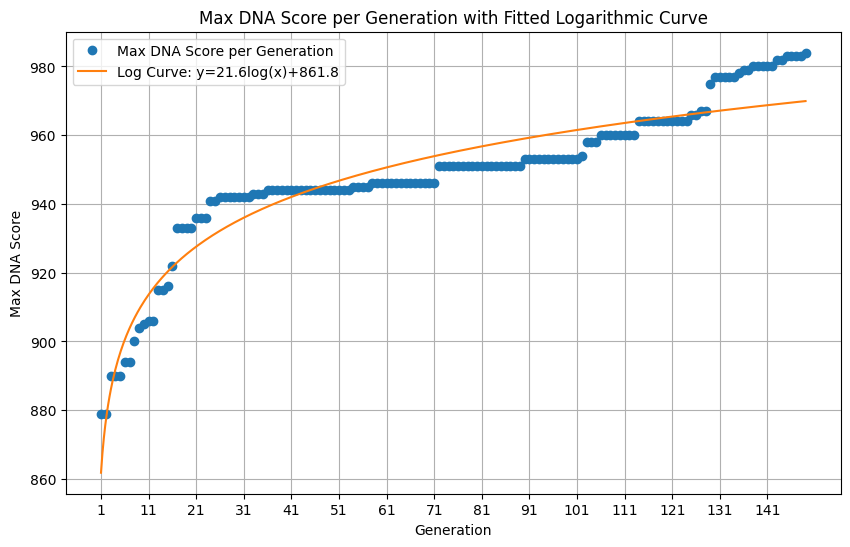

The equation of the fitted curve is: y = 21.61 * log(x) + 861.81


In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df=ga_results
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and find the max 'dna_score' for each group
max_scores_per_generation = df.groupby('generation')['dna_score'].max().reset_index()

# Extract the data for fitting
x = max_scores_per_generation['generation'][1:]
y = max_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)
a,b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Max DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Log Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Max DNA Score')
plt.title('Max DNA Score per Generation with Fitted Logarithmic Curve')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()


# Print the equation of the curve
print(f"The equation of the fitted curve is: y = {a:.2f} * log(x) + {b:.2f}")

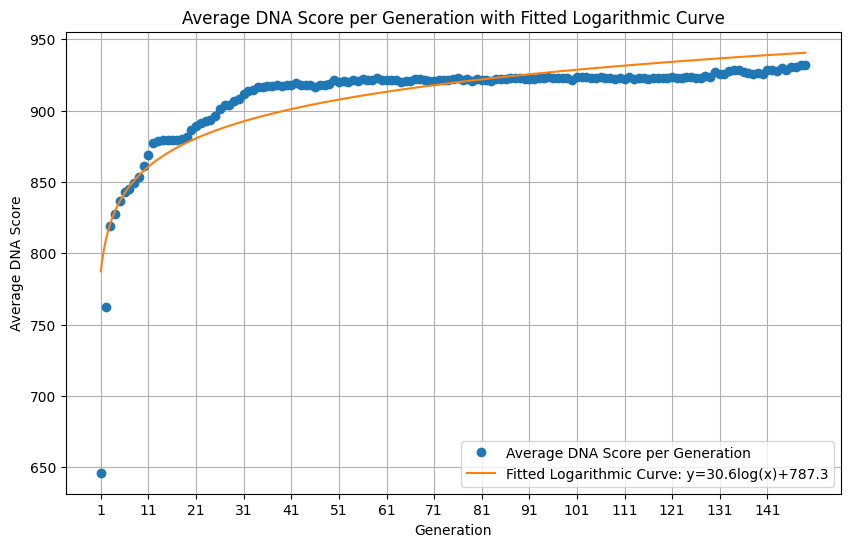

The equation of the fitted curve is: y = 30.63 * log(x) + 787.26


In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and calculate the average 'dna_score' for each group
average_scores_per_generation = df.groupby('generation')['dna_score'].mean().reset_index()

# Extract the data for fitting
x = average_scores_per_generation['generation'][1:]
y = average_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)

# Extract parameters
a, b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Average DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Fitted Logarithmic Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average DNA Score')
plt.title('Average DNA Score per Generation with Fitted Logarithmic Curve')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()

# Print the equation of the curve
print(f"The equation of the fitted curve is: y = {a:.2f} * log(x) + {b:.2f}")

Number of synapses: 49


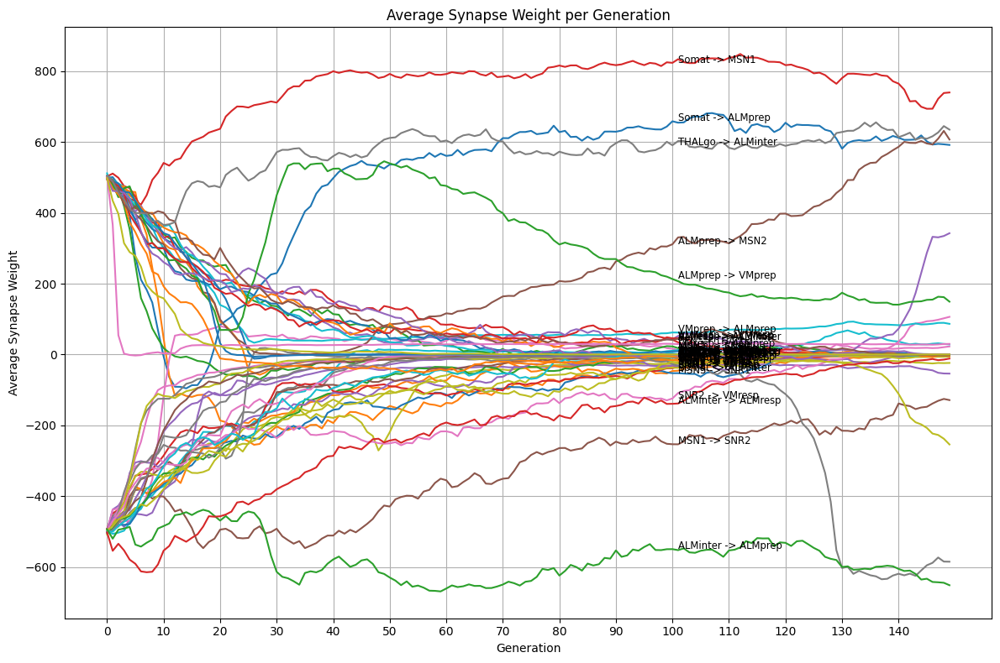

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]

# Plotting
plt.figure(figsize=(12, 8))

# Plot each synapse's average weight over generations
for i in range(num_synapses):  # Use the actual number of synapses
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[i], label=synapse_labels[i])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(100)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[i],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[i][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average Synapse Weight')
plt.title('Average Synapse Weight per Generation')

# Set sparse tick marks
plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()

In [2]:
best_run = ga_results.iloc[0]

# Create a labeled Series for the best run's DNA
best_run_labeled = pd.Series(best_run['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])
non_zero_count = (best_run_labeled != 0).sum()

display(best_run_labeled)
len(best_run_labeled)
print(non_zero_count)

Somat -> ALMprep        834
Somat -> ALMinter         0
Somat -> ALMresp          0
Somat -> MSN1          1000
MSN1 -> SNR1             -7
MSN1 -> SNR2            -10
MSN1 -> SNR3              0
MSN2 -> SNR1              0
MSN2 -> SNR2            -20
MSN2 -> SNR3             24
MSN3 -> SNR1              0
MSN3 -> SNR2              0
MSN3 -> SNR3             -4
SNR1 -> VMprep            0
SNR1 -> VMresp            0
SNR2 -> VMprep            0
SNR2 -> VMresp          104
SNR3 -> VMprep            0
SNR3 -> VMresp         -365
VMprep -> ALMprep        82
VMprep -> ALMinter        0
VMprep -> ALMresp         0
VMresp -> ALMprep         0
VMresp -> ALMinter        0
VMresp -> ALMresp       172
ALMprep -> MSN2         645
ALMinter -> MSN1          0
ALMinter -> MSN2          0
ALMinter -> MSN3          0
ALMresp -> MSN1           0
ALMresp -> MSN2           0
ALMresp -> MSN3         -78
ALMprep -> VMprep        55
ALMresp -> VMresp         0
MSN1 -> MSN2              0
MSN1 -> MSN3        

18


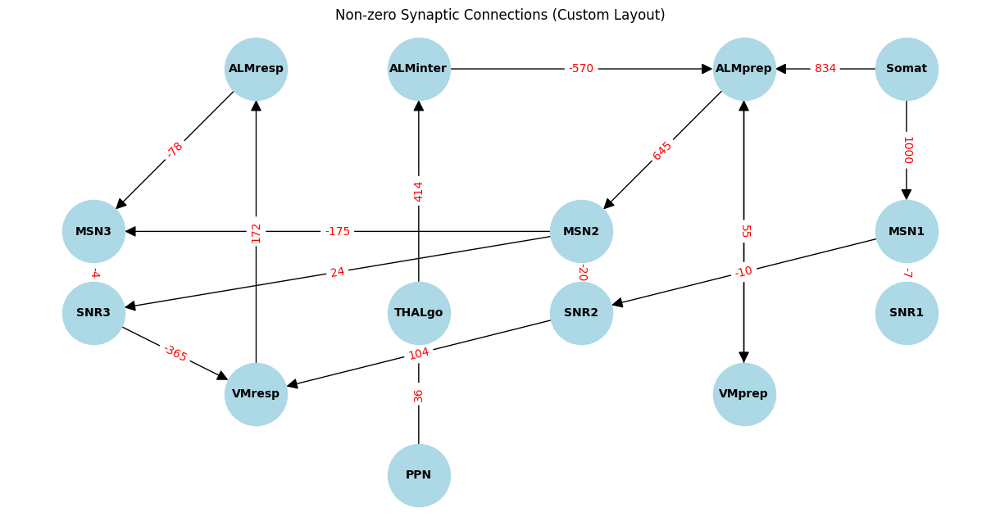

In [3]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.DiGraph()

# Add nodes for each neuron
G.add_nodes_from(NEURON_NAMES)

# Add edges for non-zero synaptic connections
for synapse, weight in best_run_labeled.items():
    if weight != 0:
        source, target = synapse.split(' -> ')
        G.add_edge(source, target, weight=weight)

# Define custom positions for each node
custom_pos = {
    'Somat': (5, 5),
    'MSN1': (5, 3),
    'MSN2': (3, 3),
    'MSN3': (0, 3),
    'SNR1': (5, 2),
    'SNR2': (3, 2),
    'SNR3': (0, 2),
    'ALMinter': (2, 5),
    'PPN': (2, 0),
    'THALgo': (2, 2),
    'VMprep': (4, 1),
    'ALMprep': (4,5),
    'ALMresp': (1, 5),
    'VMresp': (1, 1)
}

# Draw the graph using the custom positions
plt.figure(figsize=(12, 6))
nx.draw(G, pos=custom_pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=10, font_weight='bold', arrowsize=20)
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos=custom_pos, edge_labels=edge_labels, font_color='red')
plt.title('Non-zero Synaptic Connections (Custom Layout)')
plt.show()

In [4]:
best_run_GA = best_run['dna']
second_best_run_GA = ga_results.iloc[1]['dna']
third_best_run_GA = ga_results.iloc[2]['dna']

curr_dna = best_run_GA

# Load DNA
dna_matrix = load_dna(curr_dna)


# === Preparing Network === 
all_neurons = create_neurons()
splits, input_waves, alpha_array = create_experiment()
criteria_dict = define_criteria()
max_score = TMAX//BIN_SIZE * len(CRITERIA_NAMES)

dna_score, neuron_data = evaluate_dna(
                dna_matrix=dna_matrix,
                neurons=all_neurons,
                alpha_array=alpha_array,
                input_waves=input_waves,
                criteria=criteria_dict,
                curr_dna=curr_dna
                )
total_score = sum(dna_score.values())
print(f'    === DNA: {curr_dna}') 
print(f'    === Control: {dna_score["control"]}/{max_score}')
print(f'    === Experimental: {dna_score["experimental"]}/{max_score}')
print(f'    === Overall: {total_score}({total_score/(2*max_score):.2%})')
print('\n')
"""
neuron_data = {
    'experimental': {
        'neuron_name': {
            'hist_V': np.array(),
            'spike_times': np.array()
        },
    'control': {
        'neuron_name': {
            'hist_V': np.array(),
            'spike_times': np.array()
        }
    }
}
"""

diagnostic = {
        'show_dna_matrix' : True,
        'show_neuron_plots' : True,
        'show_difference_histogram' : False,
        'show_dna_scores': True
    }


if diagnostic['show_dna_matrix']:
                print("Currently loaded matrix ---")
                display_matrix(dna_matrix, NEURON_NAMES)

if diagnostic['show_dna_scores']:
                print(f'{dna_score=}: {curr_dna}')
            
if diagnostic['show_neuron_plots']:
                for condition in ['experimental', 'control']:
                    target_neurons_hist_Vs = np.array([neuron_data[condition][name]['hist_V'] for name in NEURON_NAMES])
                    plot_neurons_interactive(hist_Vs=target_neurons_hist_Vs, neuron_names=NEURON_NAMES, sq_wave=input_waves[0], go_wave=input_waves[1], show_u=False)
                    

Neuron#: ALMprep ==== Period#: 30 ==== Time: 3000-3100 ==== Condition: experimental
Spikes: 0 ==== Criteria: 1
Neuron#: ALMprep ==== Period#: 31 ==== Time: 3100-3200 ==== Condition: experimental
Spikes: 0 ==== Criteria: 1
Neuron#: ALMresp ==== Period#: 30 ==== Time: 3000-3100 ==== Condition: experimental
Spikes: 0 ==== Criteria: 1
Neuron#: ALMresp ==== Period#: 47 ==== Time: 4700-4800 ==== Condition: experimental
Spikes: 5 ==== Criteria: 0
Neuron#: ALMresp ==== Period#: 48 ==== Time: 4800-4900 ==== Condition: experimental
Spikes: 6 ==== Criteria: 0
Neuron#: ALMresp ==== Period#: 49 ==== Time: 4900-5000 ==== Condition: experimental
Spikes: 5 ==== Criteria: 0
Neuron#: SNR1 ==== Period#: 10 ==== Time: 1000-1100 ==== Condition: experimental
Spikes: 2 ==== Criteria: 0
Neuron#: SNR2 ==== Period#: 10 ==== Time: 1000-1100 ==== Condition: experimental
Spikes: 2 ==== Criteria: 0
Neuron#: SNR3 ==== Period#: 29 ==== Time: 2900-3000 ==== Condition: experimental
Spikes: 0 ==== Criteria: 1
Neuron#: S

,Somat,MSN1,SNR1,VMprep,ALMprep,MSN2,SNR2,PPN,THALgo,ALMinter,MSN3,SNR3,ALMresp,VMresp
Somat,0.0,1000.0,0.0,0.0,834.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN1,0.0,0.0,-7.0,0.0,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
VMprep,0.0,0.0,0.0,0.0,82.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ALMprep,0.0,0.0,0.0,55.0,0.0,645.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN2,0.0,0.0,0.0,0.0,0.0,0.0,-20.0,0.0,0.0,0.0,-175.0,24.0,0.0,0.0
SNR2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,104.0
PPN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,0.0,0.0,0.0,0.0,0.0
THALgo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,414.0,0.0,0.0,0.0,0.0
ALMinter,0.0,0.0,0.0,0.0,-570.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


dna_score={'experimental': 484, 'control': 500}: [834, 0, 0, 1000, -7, -10, 0, 0, -20, 24, 0, 0, -4, 0, 0, 0, 104, 0, -365, 82, 0, 0, 0, 0, 172, 645, 0, 0, 0, 0, 0, -78, 55, 0, 0, 0, 0, -175, 0, 0, 0, 0, -570, 0, 0, 0, 36, 414, 0]
hist_Vs=array([[-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-80.        , -78.6       , -78.7008    , ..., -77.87042631,
        -77.87042631, -77.8704263 ],
       [-60.        , -58.8       , -57.75792   , ..., -51.35845705,
        -51.24843555, -51.12314992],
       ...,
       [-60.        , -58.8       , -57.75792   , ..., -63.01443358,
        -63.01592301, -63.01443358],
       [-60.        , -60.        , -60.        , ..., -34.94340062,
        -31.60042729, -27.44154846],
       [-60.        , -60.        , -60.        , ..., -49.68649977,
        -49.16134636, -48.60434043]])
neuron_names=['Somat', 'MSN1', 'SNR1', 'VMprep', 'ALMprep', 'MSN2', 'SNR2', 'PPN', 'THALgo', 'ALMinter', 'MSN3',

hist_Vs=array([[-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-80.        , -78.6       , -78.7008    , ..., -77.87042615,
        -77.87042615, -77.87042615],
       [-60.        , -58.8       , -57.75792   , ..., -50.37370542,
        -50.18135139, -49.97471025],
       ...,
       [-60.        , -58.8       , -57.75792   , ..., -50.37370542,
        -50.18135139, -49.97471025],
       [-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-60.        , -60.        , -60.        , ..., -77.46884371,
        -77.44286856, -77.40968947]])
neuron_names=['Somat', 'MSN1', 'SNR1', 'VMprep', 'ALMprep', 'MSN2', 'SNR2', 'PPN', 'THALgo', 'ALMinter', 'MSN3', 'SNR3', 'ALMresp', 'VMresp']
